In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np

def get_piano_notes():   
    # White keys are in Uppercase and black keys (sharps) are in lowercase
    octave = ['C', 'c', 'D', 'd', 'E', 'F', 'f', 'G', 'g', 'A', 'a', 'B'] 
    base_freq = 440 #Frequency of Note A4
    keys = np.array([x+str(y) for y in range(0,9) for x in octave])
    # Trim to standard 88 keys
    start = np.where(keys == 'A0')[0][0]
    end = np.where(keys == 'C8')[0][0]
    keys = keys[start:end+1]
    
    note_freqs = dict(zip(keys, [2**((n+1-49)/12)*base_freq for n in range(len(keys))]))
    note_freqs[''] = 0.0 # stop
    return note_freqs

In [3]:
get_piano_notes()

{'': 0.0,
 'A0': 27.5,
 'A1': 55.0,
 'A2': 110.0,
 'A3': 220.0,
 'A4': 440.0,
 'A5': 880.0,
 'A6': 1760.0,
 'A7': 3520.0,
 'B0': 30.86770632850775,
 'B1': 61.7354126570155,
 'B2': 123.47082531403103,
 'B3': 246.94165062806206,
 'B4': 493.8833012561241,
 'B5': 987.7666025122483,
 'B6': 1975.533205024496,
 'B7': 3951.066410048992,
 'C1': 32.70319566257483,
 'C2': 65.40639132514966,
 'C3': 130.8127826502993,
 'C4': 261.6255653005986,
 'C5': 523.2511306011972,
 'C6': 1046.5022612023945,
 'C7': 2093.004522404789,
 'C8': 4186.009044809578,
 'D1': 36.70809598967594,
 'D2': 73.41619197935188,
 'D3': 146.8323839587038,
 'D4': 293.6647679174076,
 'D5': 587.3295358348151,
 'D6': 1174.6590716696303,
 'D7': 2349.31814333926,
 'E1': 41.20344461410875,
 'E2': 82.4068892282175,
 'E3': 164.81377845643496,
 'E4': 329.6275569128699,
 'E5': 659.2551138257398,
 'E6': 1318.5102276514797,
 'E7': 2637.02045530296,
 'F1': 43.653528929125486,
 'F2': 87.30705785825097,
 'F3': 174.61411571650194,
 'F4': 349.22823

In [4]:
from IPython.display import Audio, display

sound_hey = "hpd.wav"

display(Audio(sound_hey, autoplay=True))  # plays ok


In [5]:
from scipy.io import wavfile
import matplotlib.pyplot as plt
plt.style.use('seaborn-dark')

# Load data from wav file
sample_rate, middle_c = wavfile.read('/content/drive/MyDrive/Interdisciplinary (1)/1/hpd.wav')

Sample rate: 48000
3848011


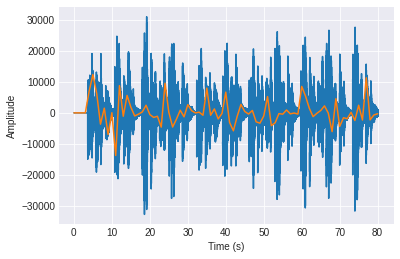

In [6]:
print("Sample rate:", sample_rate)
a = middle_c.T[0]
t = np.linspace(0, len(a)/sample_rate, num=len(a))
len_a = len(a)
print(len_a)
a_test = a[::sample_rate]
t_test = t[::sample_rate]
b = middle_c.T[1]
# # Plot sound wave
plt.plot(t, a)
plt.plot(t_test, a_test)
# plt.plot(b)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid()

In [7]:
# wavfile.write("new_hpd.wav", sample_rate, a)

# display(Audio("new_hpd.wav", autoplay=True))  # plays ok

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Depr

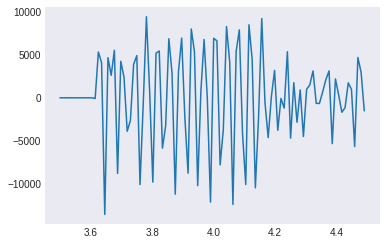

In [8]:
fig, ax = plt.subplots()
t_start = 3.5
t_end = 4.5

start = np.int(t_start * sample_rate)
end = np.int(t_end * sample_rate)
ax.plot(t[start:end:500], a[start:end:500]) # looks it's C note

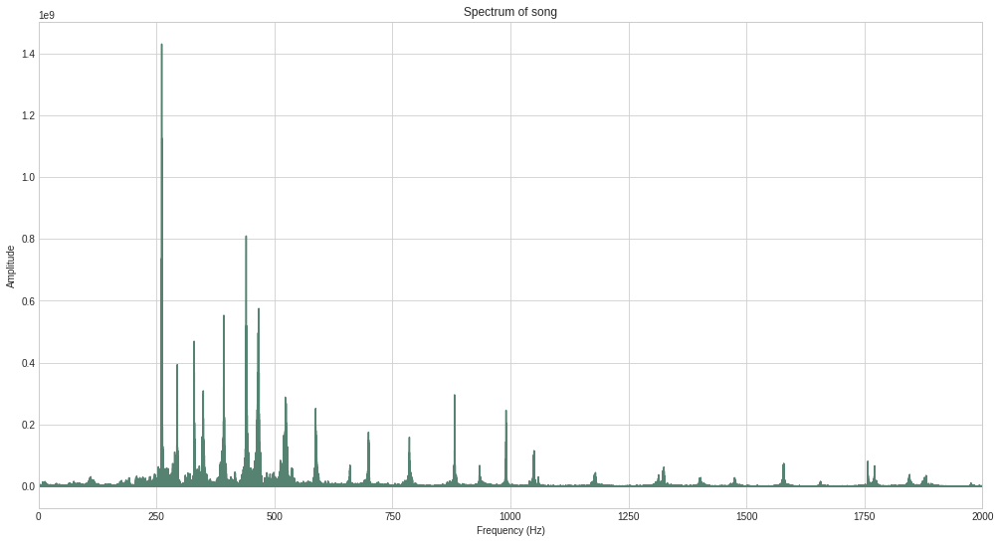

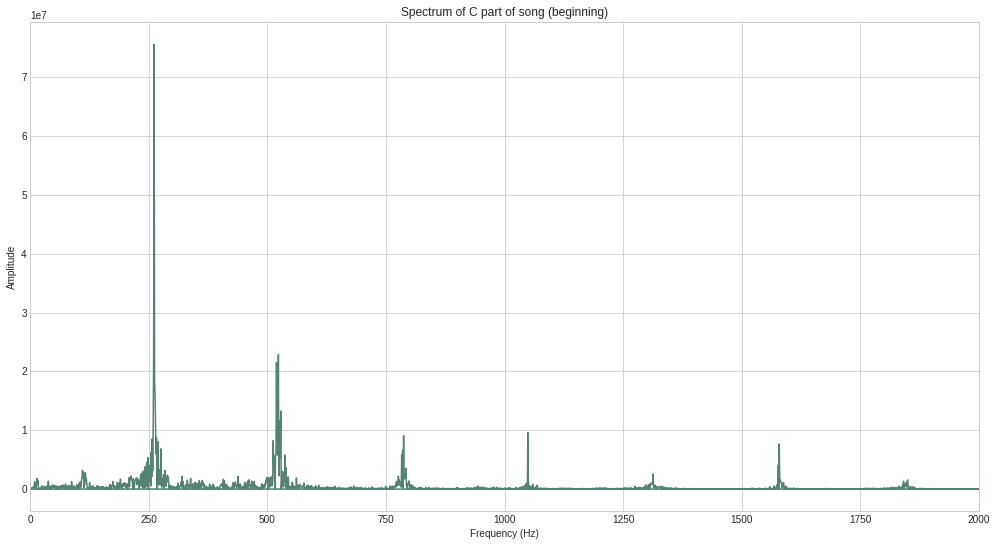

In [9]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt

def plot_frequency_fft(amplitude, title):
  #FFT
  t = np.arange(len(amplitude))
  freq = np.fft.fftfreq(t.shape[-1])*sample_rate
  sp = np.fft.fft(amplitude) 

  plt.figure(figsize=(17,9)) 
  plt.style.use('seaborn-whitegrid')
  plt.xlabel('Frequency (Hz)')
  plt.ylabel('Amplitude')
  plt.title(title)
  plt.plot(freq, abs(sp.real), color = "#558271")
  plt.xlim([0, 2000])
  plt.show()


plot_frequency_fft(a, "Spectrum of song")
plot_frequency_fft(a[start:end], "Spectrum of C part of song (beginning)")

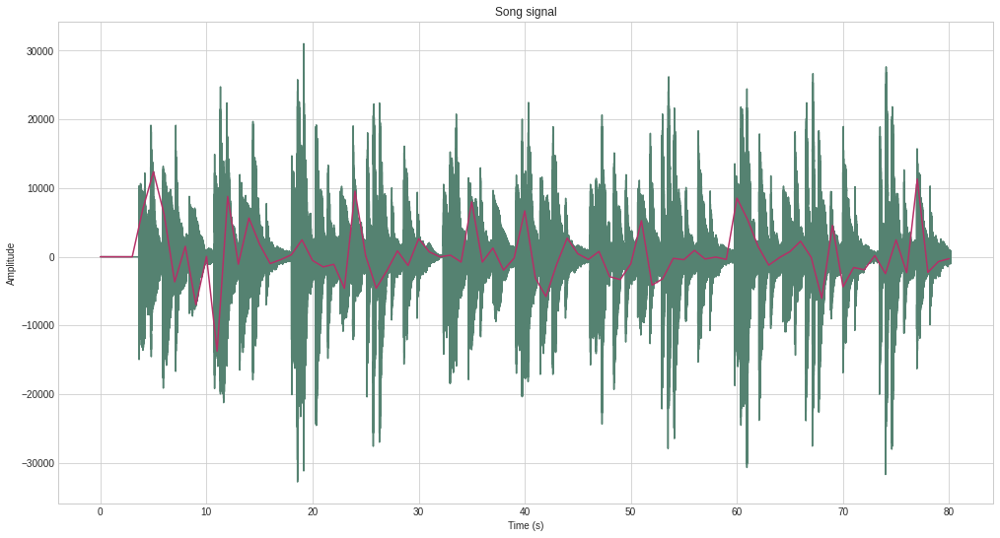

In [10]:
def plot_signal(time, amplitude, title):
  plt.figure(figsize=(17,9)) 
  plt.style.use('seaborn-whitegrid')
  plt.xlabel('Time (s)')
  plt.ylabel('Amplitude')
  plt.title(title)
  plt.plot(time, amplitude, color = "#558271")
  a_test = a[::sample_rate]
  t_test = t[::sample_rate]
  plt.plot(t_test, a_test, color = "#b52f67")
  plt.show()

# Plot sound wave
plot_signal(t, a, "Song signal")